In this Project, we will go through several examples to set up diffusion models.

We will first generate an example following the diffusion probabilistic model pipeline.

Then, we will consider text to image generation.

We will use the 🧨**diffusers** library from 🤗Huggingface.

In particular, we will use several pretrained models to generate Images in different ways.

These examples have been taken from the two tutorials on hugging face.
- https://huggingface.co/docs/diffusers/using-diffusers/write_own_pipeline

- https://huggingface.co/docs/diffusers/tutorials/autopipeline

## 1. Generate an image from a pretrained DDPM model

Hugging face allow users to share their pretrained models. Here, we will use the **DDPMPipeline.from_pretrained()** method to load the following models and generate one image for each of them.

**Model_ids:** "google/ddpm-cat-256", "google/ddpm-church-256", "google/ddpm-celebahq-256", "google/ddpm-bedroom-256", "google/ddpm-cifar10-32".

In [ ]:
! pip install diffusers

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
from diffusers import DDPMPipeline
model_ids = ["google/ddpm-cat-256", "google/ddpm-church-256", "google/ddpm-celebahq-256", "google/ddpm-bedroom-256", "google/ddpm-cifar10-32"]
image_list = []
for model_id in model_ids:
  ddpm = DDPMPipeline.from_pretrained(model_id).to("cuda") #: use the DDPMPipeline
  image = ddpm(num_inference_steps=25).images[0]
  image_list.append(image)

100%|██████████| 25/25 [00:01<00:00, 13.01it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:01<00:00, 13.26it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:01<00:00, 13.27it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:00<00:00, 38.31it/s]


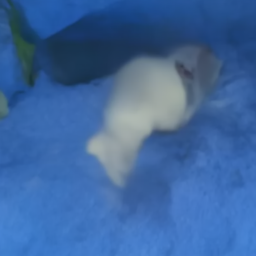

In [ ]:
image_list[0]

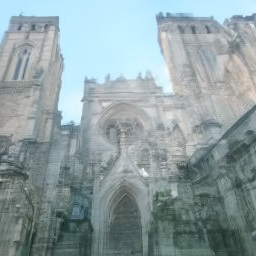

In [ ]:
image_list[1]

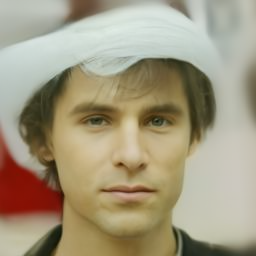

In [ ]:
image_list[2]

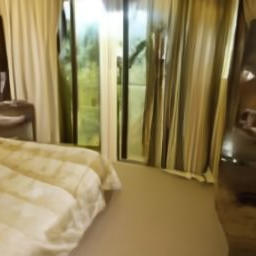

In [ ]:
image_list[3]

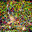

In [ ]:
image_list[4]

## 2. Use DDIM pipeline in the previous setup

With the same pretrained model we used in the previous problem, DDPM scheduler yields the highest quality, but it also takes the longest time.

For a nice tradeoff between quality and inference speed, next we consider the DDIM pipeline instead.

In [ ]:
from diffusers import DDIMPipeline
model_ids = ["google/ddpm-cat-256", "google/ddpm-church-256", "google/ddpm-celebahq-256", "google/ddpm-bedroom-256", "google/ddpm-cifar10-32"]
image_list = []
for model_id in model_ids:
  ddipm = DDIMPipeline.from_pretrained(model_id).to("cuda") #: use the DDPMPipeline
  image = ddipm(num_inference_steps=25).images[0]
  image_list.append(image)

100%|██████████| 25/25 [00:01<00:00, 13.28it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:01<00:00, 13.28it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:01<00:00, 13.24it/s]
diffusion_pytorch_model.safetensors not found
100%|██████████| 25/25 [00:00<00:00, 54.34it/s]


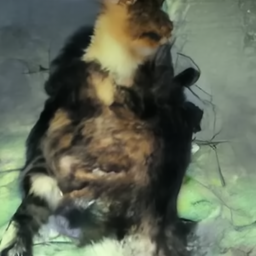

In [ ]:
image_list[0]

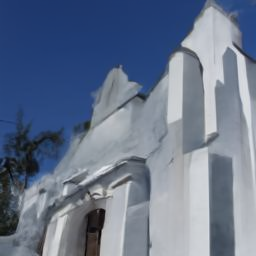

In [ ]:
image_list[1]

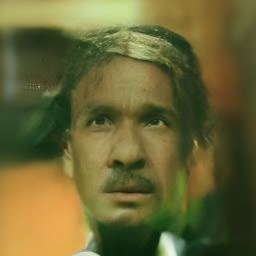

In [ ]:
image_list[2]

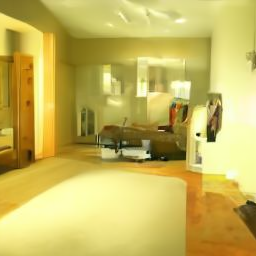

In [ ]:
image_list[3]

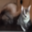

In [ ]:
image_list[4]

## 3. Generate Images with a text-to-Image pipeline

Text-to-Image diffusion model will take a text prompt as a prior and generate the image illustrating to the meaning of the prompt.

For this part, let us use the **AutoPipelineForText2Image** pipeline to load the pretrained model. We will use the stable diffusion model.

In particular, use **"runwayml/stable-diffusion-v1-5"** to generate **5** different images with **5** different prompts.

In [ ]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

Loading pipeline components...:  71%|███████▏  | 5/7 [00:01<00:00,  5.18it/s]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  3.46it/s]


In [ ]:
# prompts
prompt1 = "Sky Diving under an ocean"
prompt2 = "Scubadiving"
prompt3 = "Motorbike on a rainy road"
prompt4 = "Watching Sunset"
prompt5 = "Dog running"
image_list = []
for prompt in [prompt1, prompt2, prompt3, prompt4, prompt5]:
  image = pipeline(prompt, num_inference_steps=25).images[0]
  image_list.append(image)

100%|██████████| 25/25 [00:07<00:00,  3.29it/s]


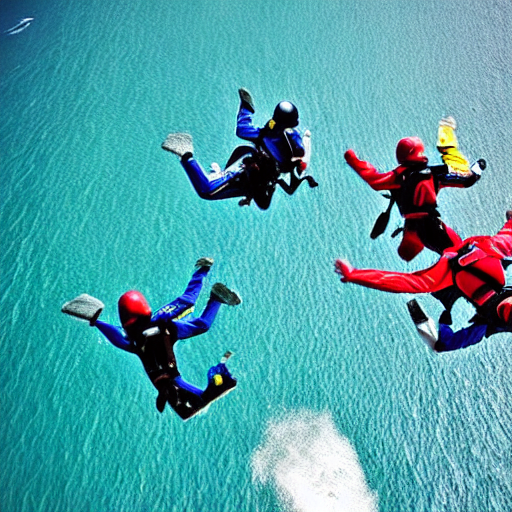

In [ ]:
image_list[0]

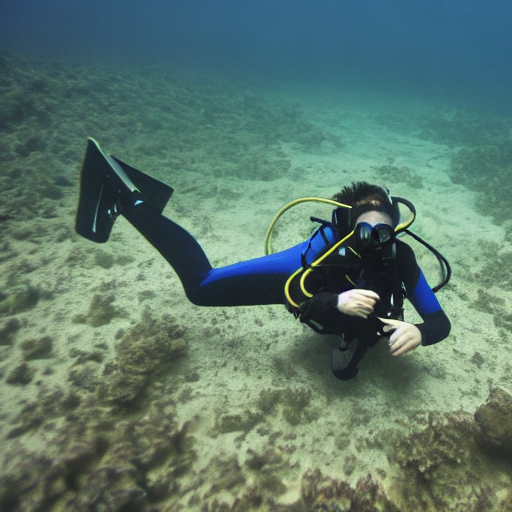

In [ ]:
image_list[1]

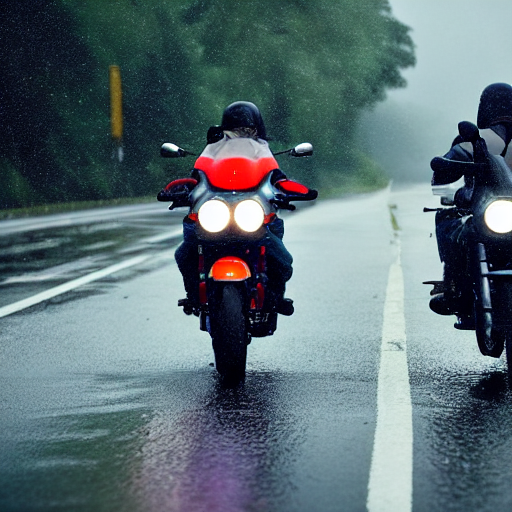

In [ ]:
image_list[2]

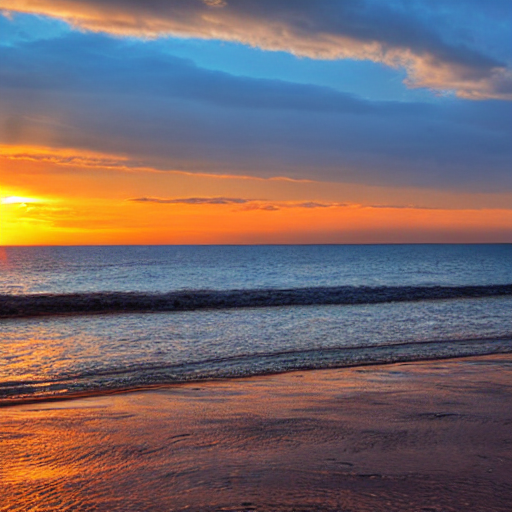

In [ ]:
image_list[3]

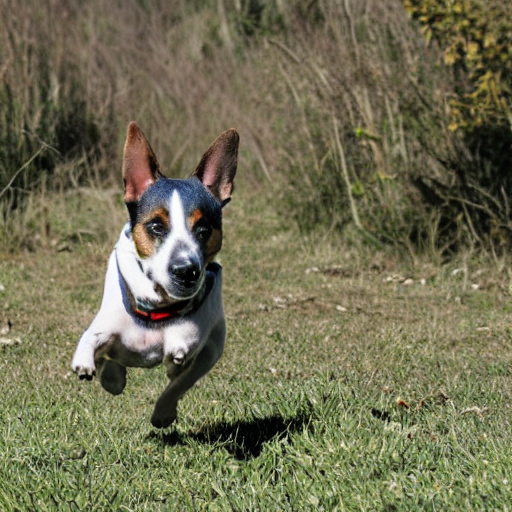

In [ ]:
image_list[4]

## 4. Set up an Image-to-Image pipeline

let us use the **AutoPipelineForImage2Image** pipeline to load the same **"runwayml/stable-diffusion-v1-5"** model checkpoint.

Then, modify the image provided in the url with **5** different text prompts.

In [ ]:
from diffusers import AutoPipelineForImage2Image
import torch
import requests
from PIL import Image
from io import BytesIO


pipeline = AutoPipelineForImage2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to("cuda")


Loading pipeline components...:  71%|███████▏  | 5/7 [00:01<00:00,  4.99it/s]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  3.16it/s]


In [ ]:
# prompts
prompt1 = "Sky Diving under an ocean"
prompt2 = "Scubadiving"
prompt3 = "Motorbike on a rainy road"
prompt4 = "Watching Sunset"
prompt5 = "Dog running"
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/1665_Girl_with_a_Pearl_Earring.jpg/800px-1665_Girl_with_a_Pearl_Earring.jpg"

image_list = []
for prompt in [prompt1, prompt2, prompt3, prompt4, prompt5]:
  response = requests.get(url)
  image = Image.open(BytesIO(response.content)).convert("RGB")
  image.thumbnail((768, 768))
  image = pipeline(prompt, image, num_inference_steps=200, strength=0.75, guidance_scale=10.5).images[0]
  image_list.append(image)

100%|██████████| 150/150 [01:38<00:00,  1.53it/s]


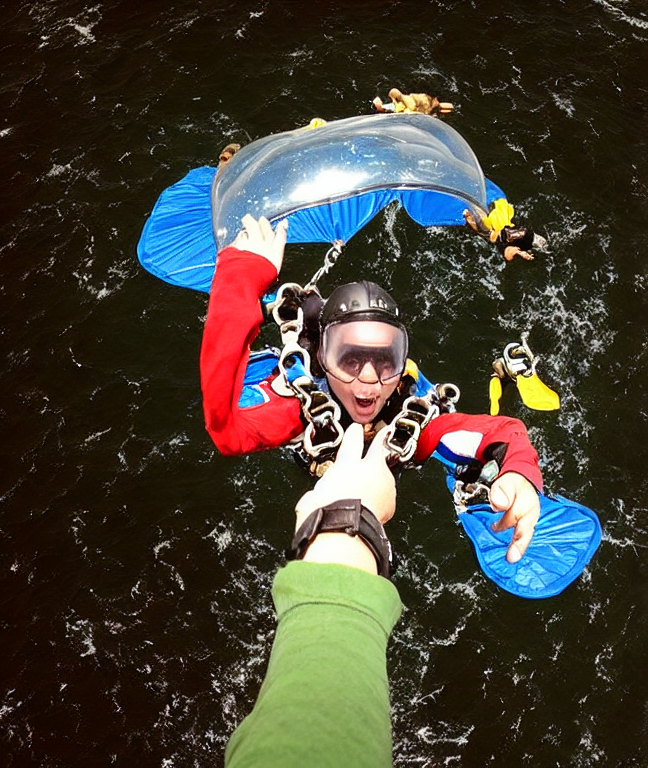

In [ ]:
image_list[0]

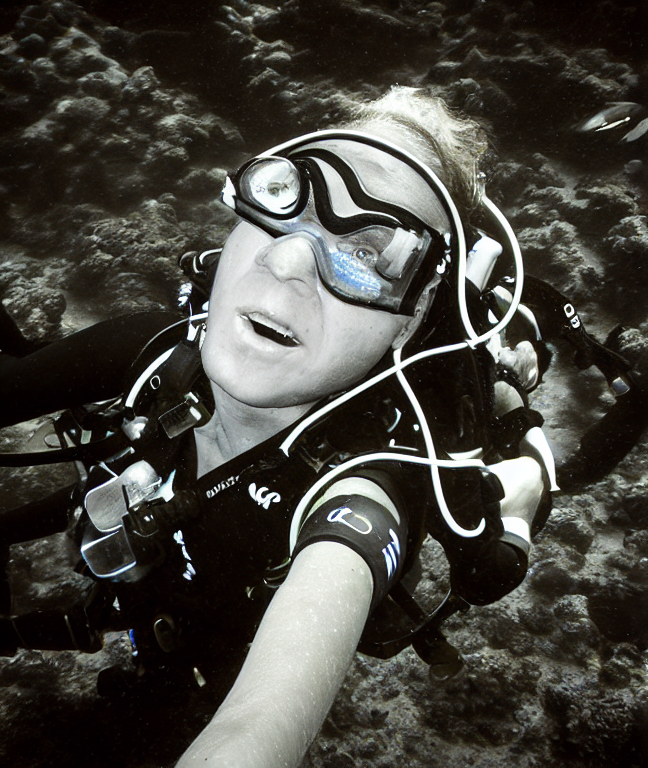

In [ ]:
image_list[1]

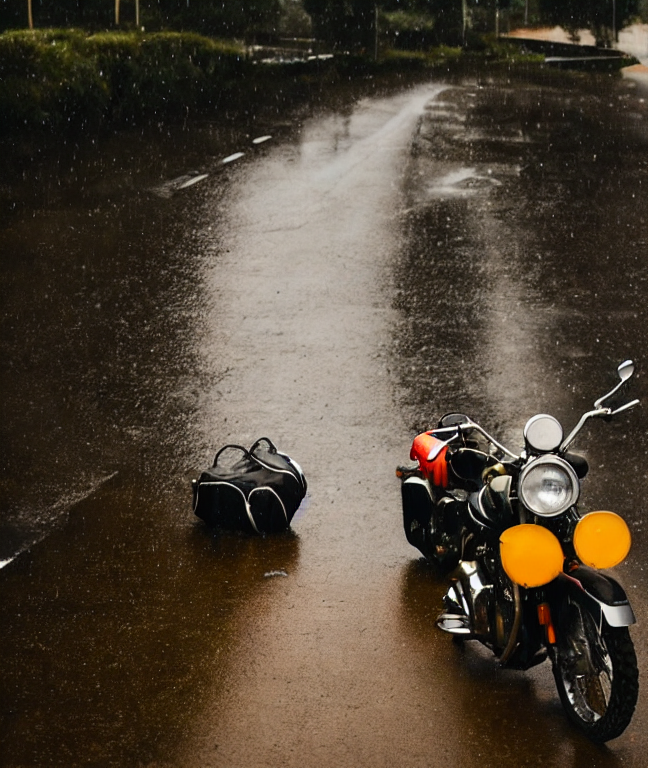

In [ ]:
image_list[2]

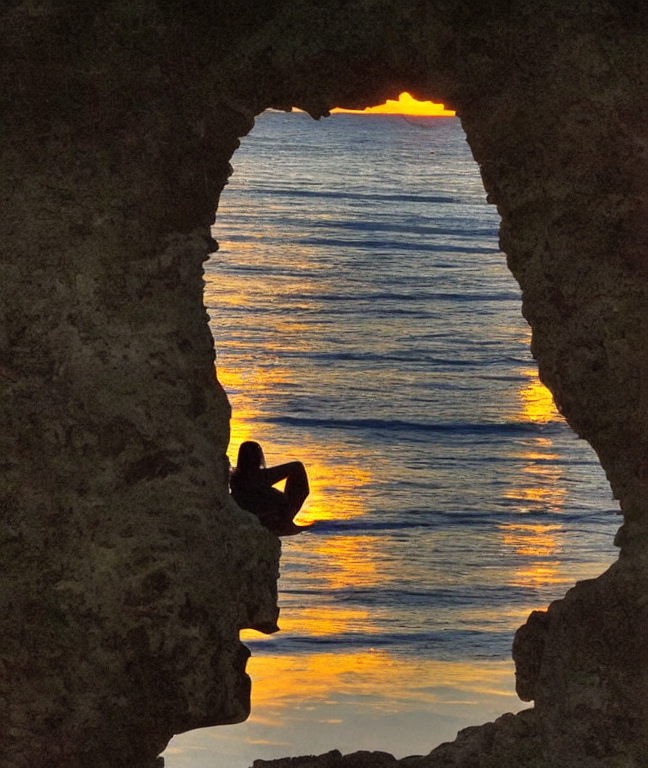

In [ ]:
image_list[3]

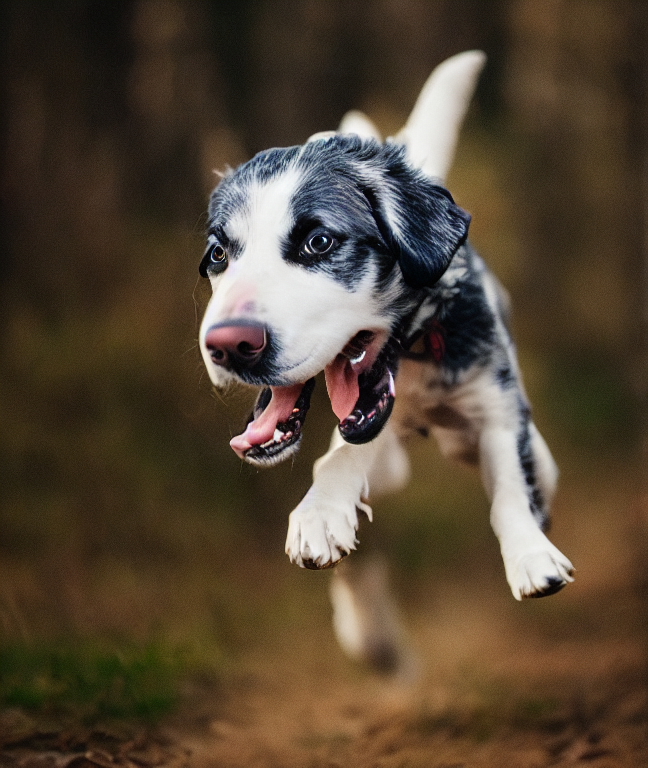

In [ ]:
image_list[4]

In [ ]:
# from diffusers import AutoPipelineForImage2Image
# import torch
# import requests
# from PIL import Image
# from io import BytesIO

# pipeline = AutoPipelineForImage2Image.from_pretrained(
#     "runwayml/stable-diffusion-v1-5",
#     torch_dtype=torch.float16,
#     use_safetensors=True,
# ).to("cuda")
# prompt = "a portrait of a dog wearing a pearl earring"

# url = "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0f/1665_Girl_with_a_Pearl_Earring.jpg/800px-1665_Girl_with_a_Pearl_Earring.jpg"

# prompt1 = "peasant and dragon combat, wood cutting style, viking era, bevel with rune"
# prompt2 = "dog running"
# prompt3 = "cat walking"
# prompt4 = "cat running"
# prompt5 = "dog walking"
# image_list = []

# for prompt in [prompt1, prompt2, prompt3, prompt4, prompt5]:
#     response = requests.get(url)
#     image = Image.open(BytesIO(response.content)).convert("RGB")
#     image.thumbnail((768, 768))

#     image = pipeline(prompt, image, num_inference_steps=200, strength=0.75, guidance_scale=10.5).images[0]
#     image_list.append(image)

Loading pipeline components...:  14%|█▍        | 1/7 [00:00<00:02,  2.86it/s]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
100%|██████████| 150/150 [01:38<00:00,  1.52it/s]
